In [1]:
import PlanetImage
import matplotlib.pyplot as plt
import numpy as np
from imp import reload
import gdal
import os
%matplotlib inline

#### Downloaded images via Planet clipping API

Gaydon Hill Farm, UK, March to October 2017

In [2]:
# reload after changes in PlanetImage.py
# PlanetImage = reload(PlanetImage)

In [3]:
# datapath = '/home/bjoern/planetlabs/gaydonhill/tif/analytic'
datapath = '/home/bjoern/planetlabs/gaydonhill_2017_OrthoTile_analytic/tif'
item = 'PSOrthoTile'
asset_type='analytic'
# datapath = '/home/bjoern/planetlabs/gaydonhill_2017_PSScene_analytic/tif/analytic'
# item = 'PSScene4Band'

fileorg = PlanetImage.FileOrganizer(datapath,asset_type,item)
print(fileorg.dates)

['2017-03-09', '2017-03-09', '2017-03-13', '2017-03-13', '2017-03-28', '2017-03-28', '2017-04-03', '2017-04-03', '2017-04-12', '2017-04-12', '2017-04-12', '2017-04-25', '2017-04-25', '2017-05-26', '2017-05-26', '2017-06-17', '2017-06-17', '2017-06-18', '2017-06-18', '2017-06-21', '2017-06-21', '2017-06-21', '2017-06-21', '2017-07-05', '2017-07-05', '2017-07-05', '2017-07-05', '2017-07-05', '2017-07-05', '2017-07-05', '2017-07-06', '2017-07-06', '2017-07-07', '2017-07-07', '2017-07-08', '2017-07-08', '2017-07-08', '2017-07-08', '2017-07-17', '2017-07-17', '2017-07-17', '2017-07-17', '2017-07-18', '2017-07-18', '2017-07-18', '2017-07-22', '2017-07-22', '2017-07-23', '2017-08-06', '2017-08-13', '2017-08-13', '2017-08-16', '2017-08-16', '2017-08-24', '2017-08-25', '2017-08-25', '2017-08-27', '2017-08-27', '2017-08-31', '2017-08-31', '2017-08-31', '2017-09-02', '2017-09-02', '2017-09-12', '2017-09-12', '2017-09-13', '2017-09-13', '2017-09-19', '2017-09-19', '2017-09-12', '2017-09-12', '2017

0 430817_3063119_2017-03-09_0e20_BGRN_Analytic_clip.tif
------------------------------------------------------------------------
array shape = (4, 1053, 1036)
min,max = 0.00e+00,1.08e+04
data type = uint16
pixel size (x,y) = 3.125,3.125 m
bands : ('B', 'G', 'R', 'NIR')
cloud cover percentage = 0.122 percent
unusable data percentage = 25.1576296875 percent
------------------------------------------------------------------------
using scaled radiance


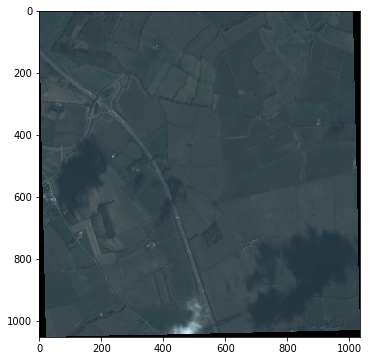

1 430817_3063219_2017-03-09_0e20_BGRN_Analytic_clip.tif
------------------------------------------------------------------------
array shape = (4, 499, 1024)
min,max = 0.00e+00,7.35e+03
data type = uint16
pixel size (x,y) = 3.125,3.125 m
bands : ('B', 'G', 'R', 'NIR')
cloud cover percentage = 0.133 percent
unusable data percentage = 4.542853125 percent
------------------------------------------------------------------------
using scaled radiance


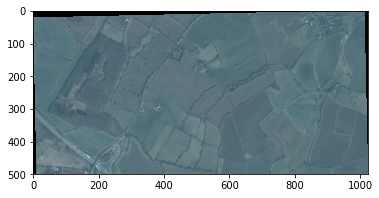

In [4]:
fileorg.rgb_preview(2,simple=False)

#### Selecting only rectangular images (only OrthoTile)

Clipping API returns two types of crops for this coordinates. They can be distinguished by '119' and '219' in the filename. Apart from marginally different times and coordinates, I haven't seen anything else in the metadata to distinguish them. 

50
0 430817_3063119_2017-03-09_0e20_BGRN_Analytic_clip.tif
------------------------------------------------------------------------
array shape = (4, 1053, 1036)
min,max = 0.00e+00,1.08e+04
data type = uint16
pixel size (x,y) = 3.125,3.125 m
bands : ('B', 'G', 'R', 'NIR')
cloud cover percentage = 0.122 percent
unusable data percentage = 25.1576296875 percent
------------------------------------------------------------------------
using scaled radiance


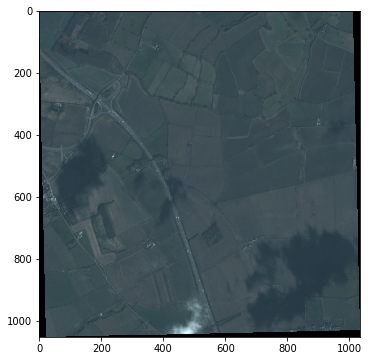

1 433524_3063119_2017-03-13_0e0f_BGRN_Analytic_clip.tif
------------------------------------------------------------------------
array shape = (4, 1053, 1036)
min,max = 0.00e+00,1.50e+04
data type = uint16
pixel size (x,y) = 3.125,3.125 m
bands : ('B', 'G', 'R', 'NIR')
cloud cover percentage = 0.178 percent
unusable data percentage = 43.1907875 percent
------------------------------------------------------------------------
using scaled radiance


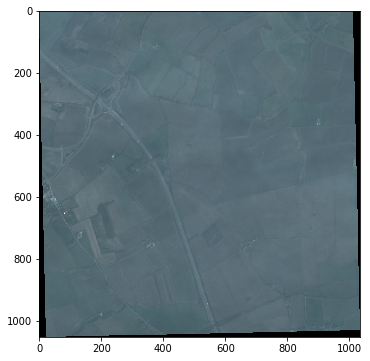

In [5]:
fileorg_rect = fileorg.select_by_namestring('119')
print(len(fileorg_rect.flist_analytic))
fileorg_rect.rgb_preview(2,simple=False,vmin=0,vmax=10000)

It seems cloud cover and unusable data fraction from the metadata are not very meaningful. Probably this data is just copied from the full image during the clipping.

### Testing image class with one image

In [6]:
testfname = fileorg_rect.flist_analytic[0]
fpath = os.path.join(datapath,testfname)
testimg = PlanetImage.PlanetImage(fpath,asset_type,item)

------------------------------------------------------------------------
array shape = (4, 1053, 1036)
min,max = 0.00e+00,1.08e+04
data type = uint16
pixel size (x,y) = 3.125,3.125 m
bands : ('B', 'G', 'R', 'NIR')
cloud cover percentage = 0.122 percent
unusable data percentage = 25.1576296875 percent
------------------------------------------------------------------------


using scaled radiance


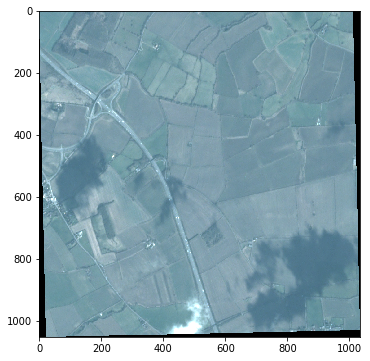

In [7]:
testimg.show_rgb(vmin=0,vmax=5e3)
# testimg.show_rgb(use_TOA=True,simple=False,vmin=0,vmax=0.4)

using scaled radiance
using scaled radiance


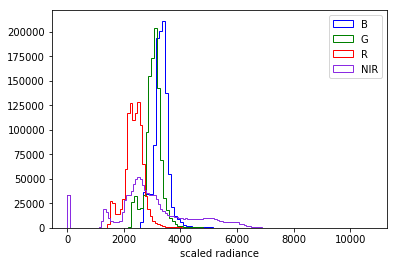

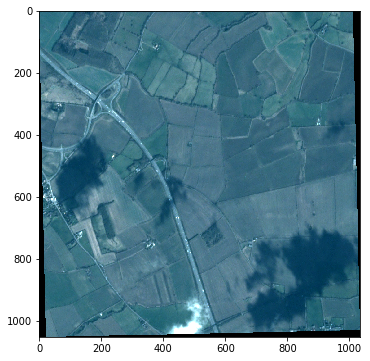

In [8]:
testimg.show_hist()
_ = testimg.get_histnorm_rgb(lims=[(1500,5000), (1500, 5000), (1500,5000)],show=True)

scaling to TOA with coeffs {1: 3.41469456044e-05, 2: 3.57223071976e-05, 3: 4.00005030466e-05, 4: 5.95968335091e-05}
using TOA reflectance
using TOA reflectance


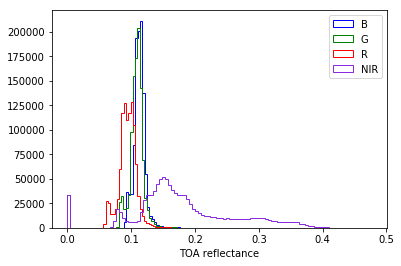

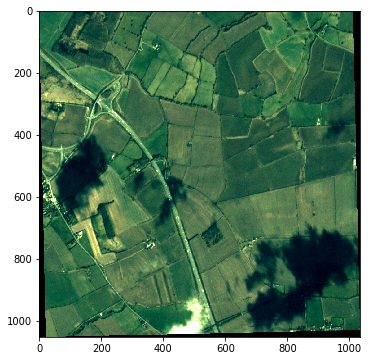

In [9]:
testimg.show_hist(use_TOA=True)
_ = testimg.get_histnorm_rgb(use_TOA=True,lims=[(0.08,0.15), (0.08, 0.15), (0.08,0.2)],show=True)

NB: RGB histogram limits are of course somewhat arbitrary, so one should not directly compare the RGB images from scaled radiance and TOA.

using scaled radiance
using TOA reflectance


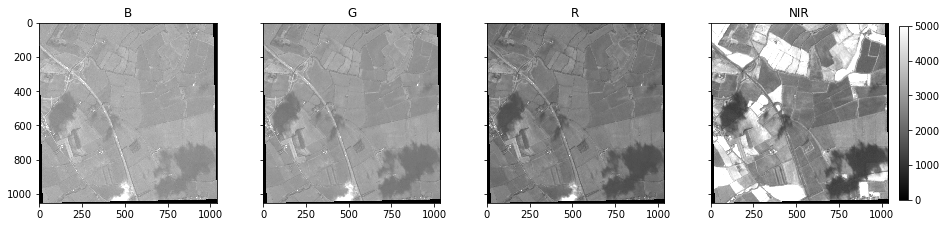

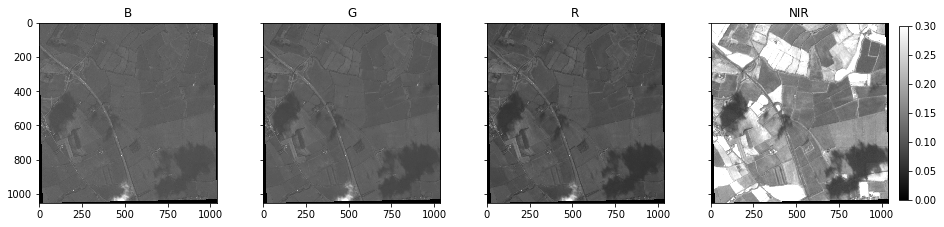

In [10]:
testimg.plot_channels(vmin=0,vmax=5000,cmap='gray')
testimg.plot_channels(use_TOA=True,vmin=0,vmax=0.3,cmap='gray')

using scaled radiance


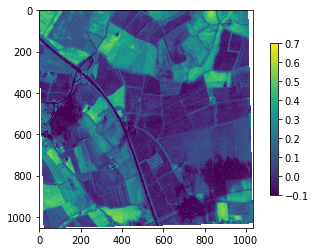

In [11]:
ndvi_scRa = testimg.get_NDVI(show=True,use_TOA=False,lims=(-0.1,0.7))

using TOA reflectance


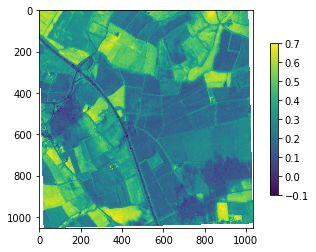

In [12]:
ndvi_TOA = testimg.get_NDVI(show=True,use_TOA=True,lims=(-0.1,0.7))

### testing masking
Instead of using the unreliable values in the metadata, we can use the supplied mask to calculate how much of the data is usable.

using scaled radiance
masked fraction in clip: 0.8 percent


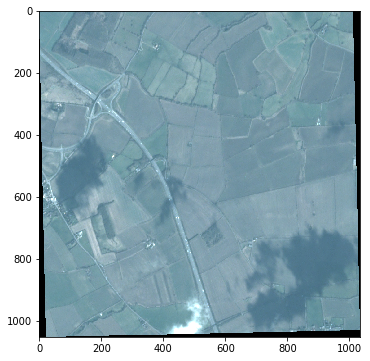

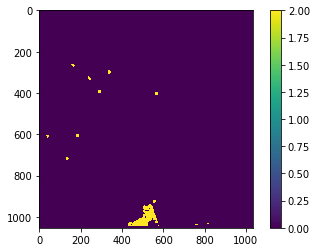

In [13]:
testimg.show_rgb(simple=False,vmax=5e3)
testimg.get_mask(show=True)
plt.show()

Clouds are identified fairly well, but cloud shadows are a problem.

### NDVI "time lapse"

-------------------------------------------------
0 430817_3063119_2017-03-09_0e20_BGRN_Analytic_clip.tif
masked fraction in clip: 0.8 percent
scaling to TOA with coeffs {1: 3.41469456044e-05, 2: 3.57223071976e-05, 3: 4.00005030466e-05, 4: 5.95968335091e-05}
using TOA reflectance
using TOA reflectance


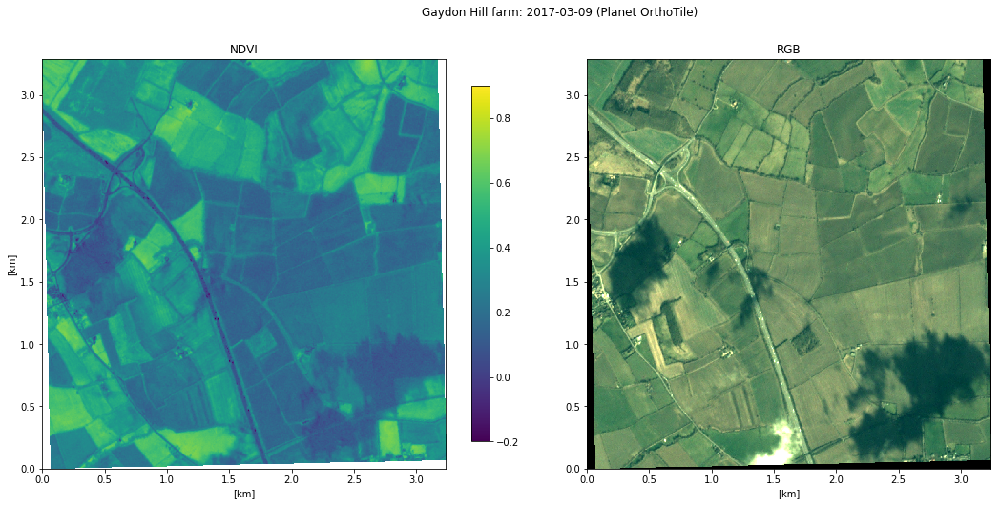

-------------------------------------------------
1 433524_3063119_2017-03-13_0e0f_BGRN_Analytic_clip.tif
masked fraction in clip: 20.7 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
2 449245_3063119_2017-03-28_0e1f_BGRN_Analytic_clip.tif
masked fraction in clip: 78.0 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
3 455890_3063119_2017-04-03_0e19_BGRN_Analytic_clip.tif
masked fraction in clip: 1.7 percent
scaling to TOA with coeffs {1: 2.6089843402e-05, 2: 2.75603227969e-05, 3: 3.07774948111e-05, 4: 4.65195686614e-05}
using TOA reflectance
using TOA reflectance


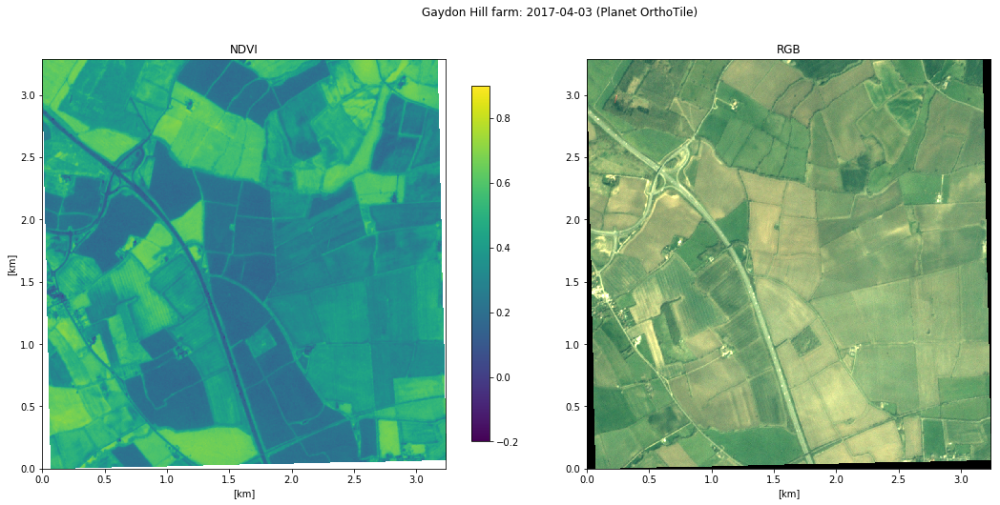

-------------------------------------------------
4 463807_3063119_2017-04-12_1005_BGRN_Analytic_clip.tif
masked fraction in clip: 96.6 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
5 464335_3063119_2017-04-12_1018_BGRN_Analytic_clip.tif
masked fraction in clip: 91.1 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
6 480289_3063119_2017-04-25_0e2f_BGRN_Analytic_clip.tif
masked fraction in clip: 33.4 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
7 518759_3063119_2017-05-26_0f51_BGRN_Analytic_clip.tif
masked fraction in clip: 48.8 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
8 557372_3063119_2017-06-17_1044_BGRN_Analytic_clip.tif
masked fraction in clip: 48.9 percent
discarding because of missing data / cloud coverage
--------------------

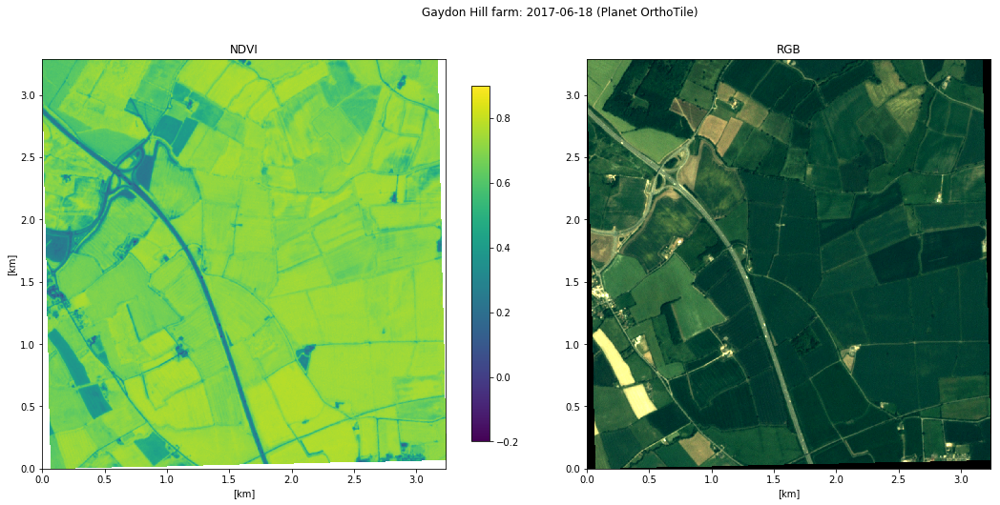

-------------------------------------------------
10 567054_3063119_2017-06-21_1012_BGRN_Analytic_clip.tif
masked fraction in clip: 51.9 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
11 567395_3063119_2017-06-21_1015_BGRN_Analytic_clip.tif
masked fraction in clip: 34.9 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
12 600238_3063119_2017-07-05_1031_BGRN_Analytic_clip.tif
masked fraction in clip: 0.5 percent
scaling to TOA with coeffs {1: 2.07424571858e-05, 2: 2.19513862447e-05, 3: 2.44214700718e-05, 4: 3.66295374552e-05}
using TOA reflectance
using TOA reflectance


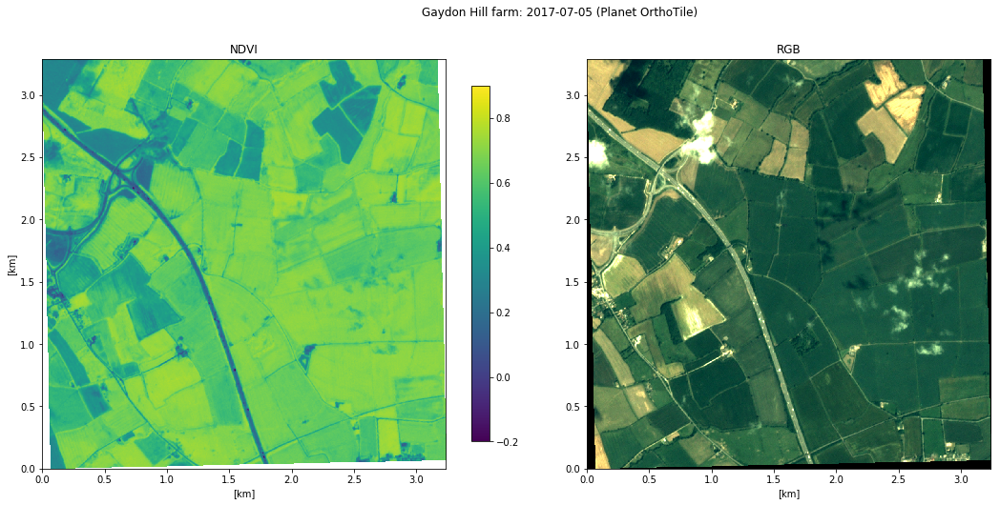

-------------------------------------------------
13 600869_3063119_2017-07-05_1019_BGRN_Analytic_clip.tif
masked fraction in clip: 96.6 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
14 601568_3063119_2017-07-05_0e2f_BGRN_Analytic_clip.tif
masked fraction in clip: 55.4 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
15 602087_3063119_2017-07-05_1012_BGRN_Analytic_clip.tif
masked fraction in clip: 1.8 percent
scaling to TOA with coeffs {1: 2.07425581079e-05, 2: 2.1929062479e-05, 3: 2.44156052906e-05, 4: 3.65591382323e-05}
using TOA reflectance
using TOA reflectance


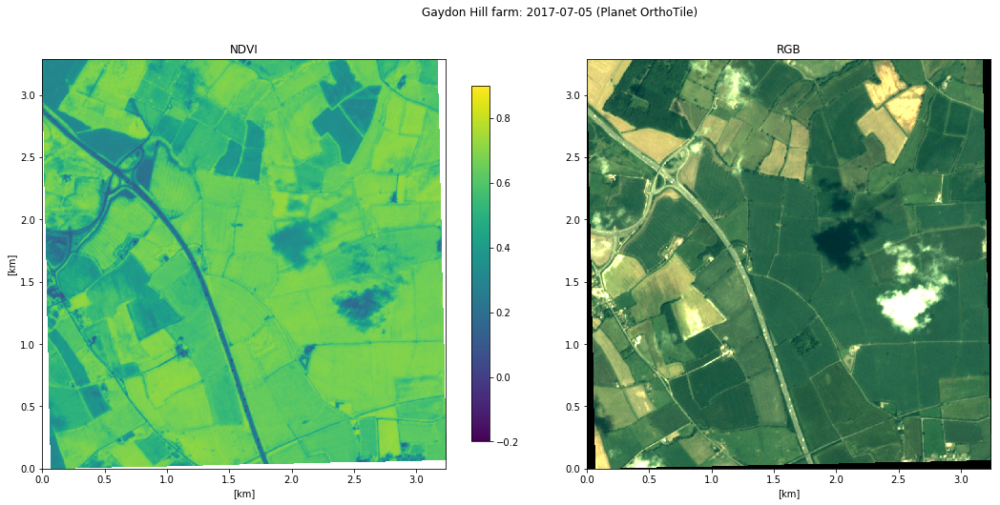

-------------------------------------------------
16 602781_3063119_2017-07-06_0f52_BGRN_Analytic_clip.tif
masked fraction in clip: 24.9 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
17 605205_3063119_2017-07-07_1035_BGRN_Analytic_clip.tif
masked fraction in clip: 13.3 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
18 607680_3063119_2017-07-08_102a_BGRN_Analytic_clip.tif
masked fraction in clip: 3.8 percent
scaling to TOA with coeffs {1: 2.07654926068e-05, 2: 2.20056151683e-05, 3: 2.44672832952e-05, 4: 3.70495023352e-05}
using TOA reflectance
using TOA reflectance


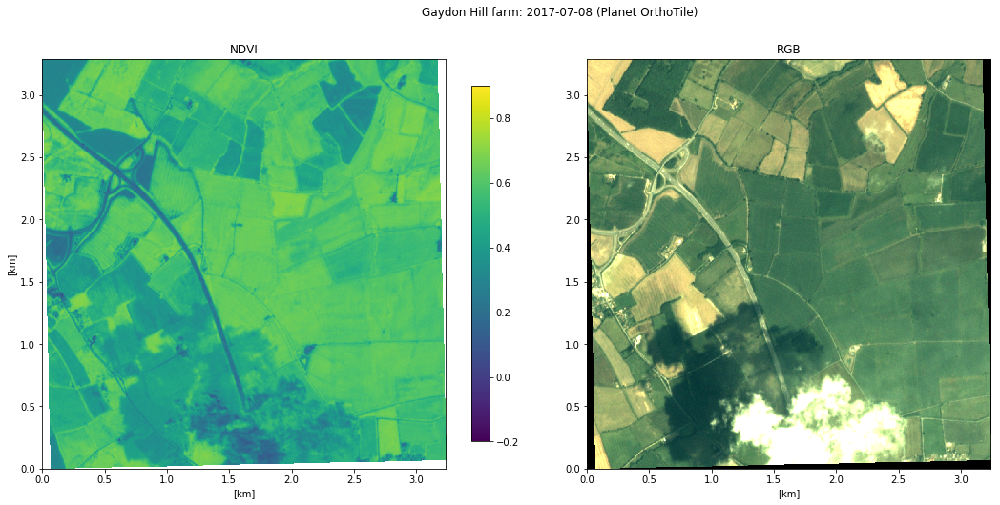

-------------------------------------------------
19 608844_3063119_2017-07-08_0e3a_BGRN_Analytic_clip.tif
masked fraction in clip: 5.8 percent
scaling to TOA with coeffs {1: 2.0629611235e-05, 2: 2.18248158381e-05, 3: 2.43811457288e-05, 4: 3.70352564674e-05}
using TOA reflectance
using TOA reflectance


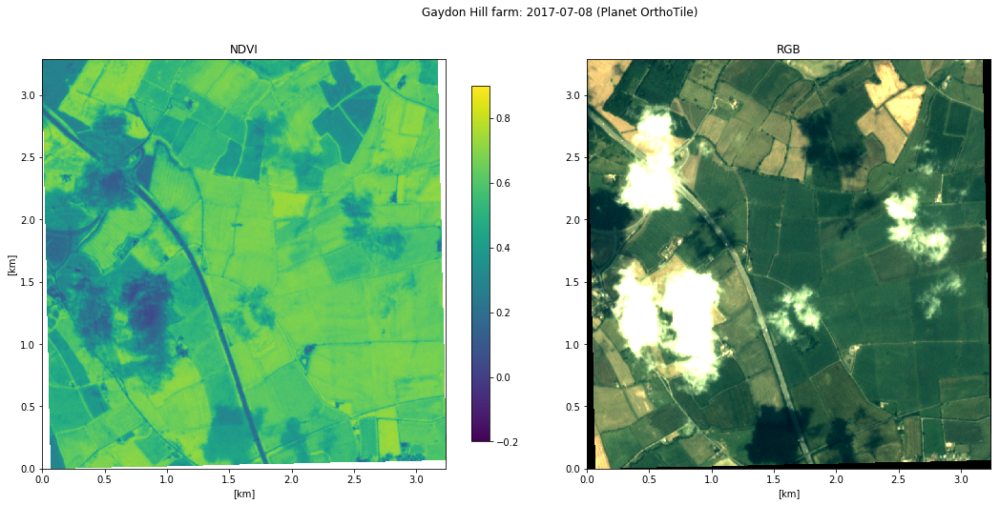

-------------------------------------------------
20 628500_3063119_2017-07-17_1003_BGRN_Analytic_clip.tif
masked fraction in clip: 0.0 percent
scaling to TOA with coeffs {1: 2.10987922876e-05, 2: 2.2360374299e-05, 3: 2.49709418418e-05, 4: 3.71136026109e-05}
using TOA reflectance
using TOA reflectance


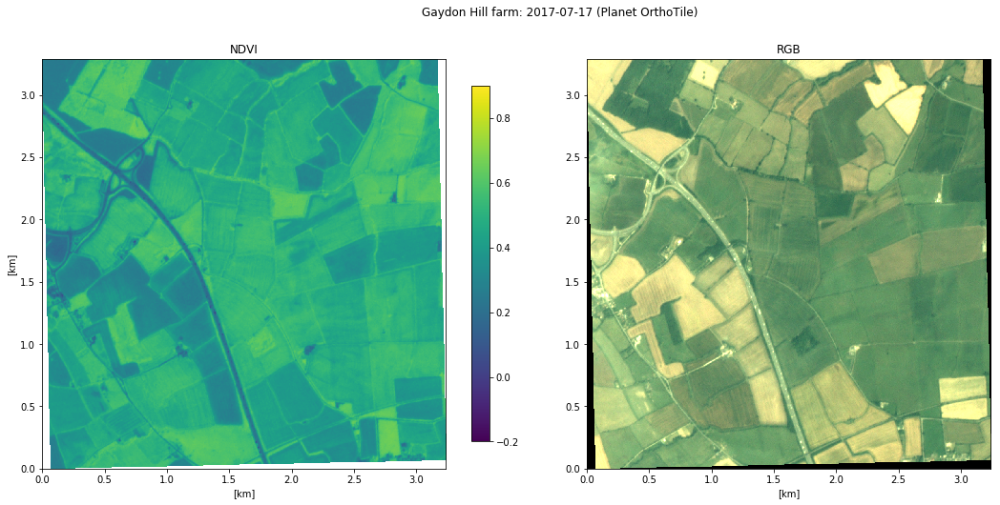

-------------------------------------------------
21 628879_3063119_2017-07-17_101f_BGRN_Analytic_clip.tif
masked fraction in clip: 0.0 percent
scaling to TOA with coeffs {1: 2.1124754635e-05, 2: 2.23630582384e-05, 3: 2.49742715532e-05, 4: 3.76967754887e-05}
using TOA reflectance
using TOA reflectance


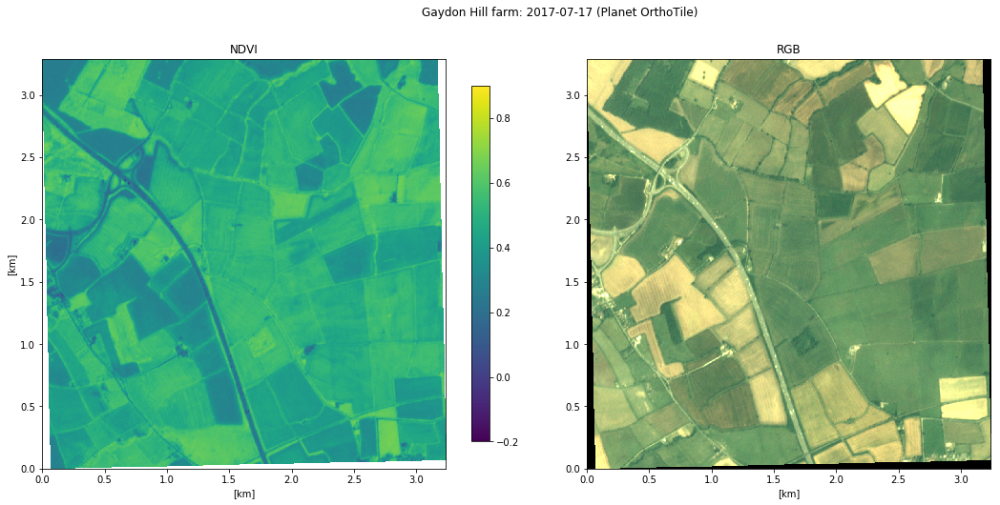

-------------------------------------------------
22 632057_3063119_2017-07-18_1007_BGRN_Analytic_clip.tif
masked fraction in clip: 28.9 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
23 632774_3063119_2017-07-18_1028_BGRN_Analytic_clip.tif
masked fraction in clip: 29.5 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
24 638818_3063119_2017-07-22_102f_BGRN_Analytic_clip.tif
masked fraction in clip: 38.4 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
25 640707_3063119_2017-07-23_0e16_BGRN_Analytic_clip.tif
masked fraction in clip: 84.6 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
26 670987_3063119_2017-08-06_100a_BGRN_Analytic_clip.tif
masked fraction in clip: 94.2 percent
discarding because of missing data / cloud coverage
---------------

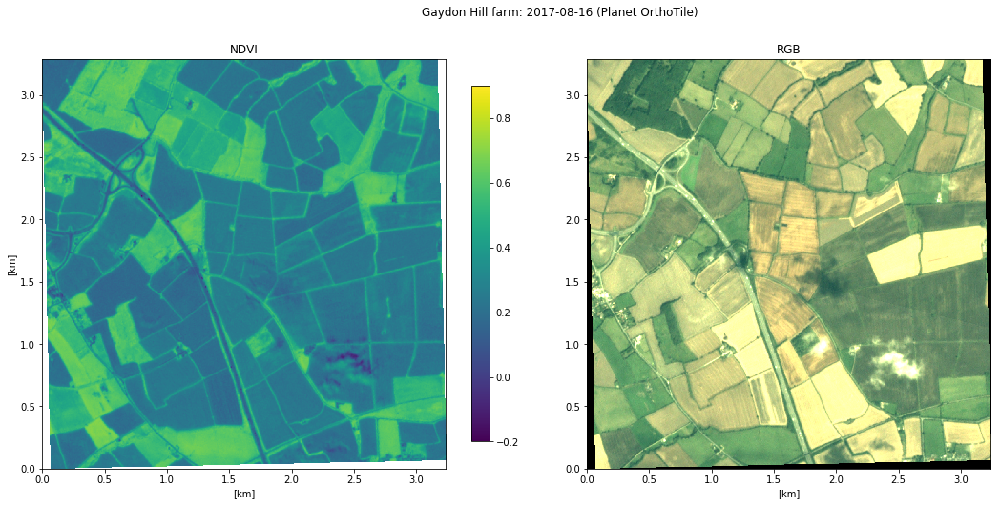

-------------------------------------------------
29 709948_3063119_2017-08-25_102e_BGRN_Analytic_clip.tif
masked fraction in clip: 0.5 percent
scaling to TOA with coeffs {1: 2.40844811352e-05, 2: 2.54877998909e-05, 3: 2.84411286787e-05, 4: 4.24299068712e-05}
using TOA reflectance
using TOA reflectance


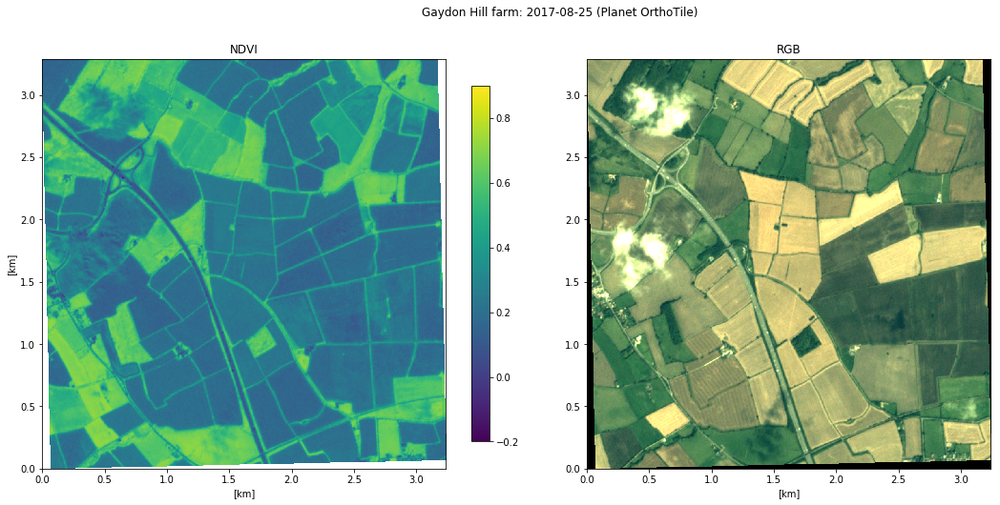

-------------------------------------------------
30 715575_3063119_2017-08-27_1008_BGRN_Analytic_clip.tif
masked fraction in clip: 70.0 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
31 724343_3063119_2017-08-31_0f41_BGRN_Analytic_clip.tif
masked fraction in clip: 82.1 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
32 728937_3063119_2017-09-02_0e3a_BGRN_Analytic_clip.tif
masked fraction in clip: 17.8 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
33 748819_3063119_2017-09-12_0f4e_BGRN_Analytic_clip.tif
masked fraction in clip: 28.3 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
34 757018_3063119_2017-09-13_103b_BGRN_Analytic_clip.tif
masked fraction in clip: 62.0 percent
discarding because of missing data / cloud coverage
---------------

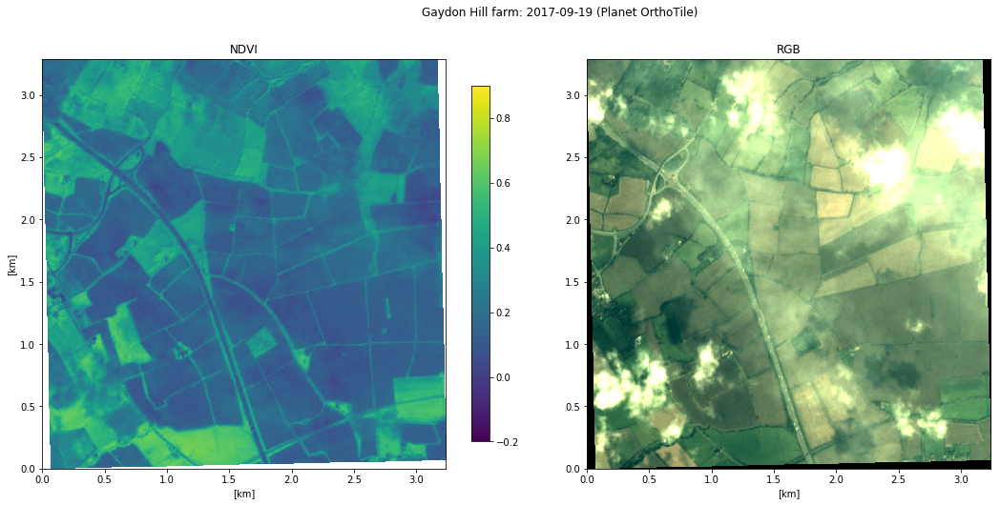

-------------------------------------------------
36 782436_3063119_2017-09-12_1038_BGRN_Analytic_clip.tif
masked fraction in clip: 8.4 percent
scaling to TOA with coeffs {1: 2.68627519299e-05, 2: 2.83770697757e-05, 3: 3.16922094715e-05, 4: 4.72350270726e-05}
using TOA reflectance
using TOA reflectance


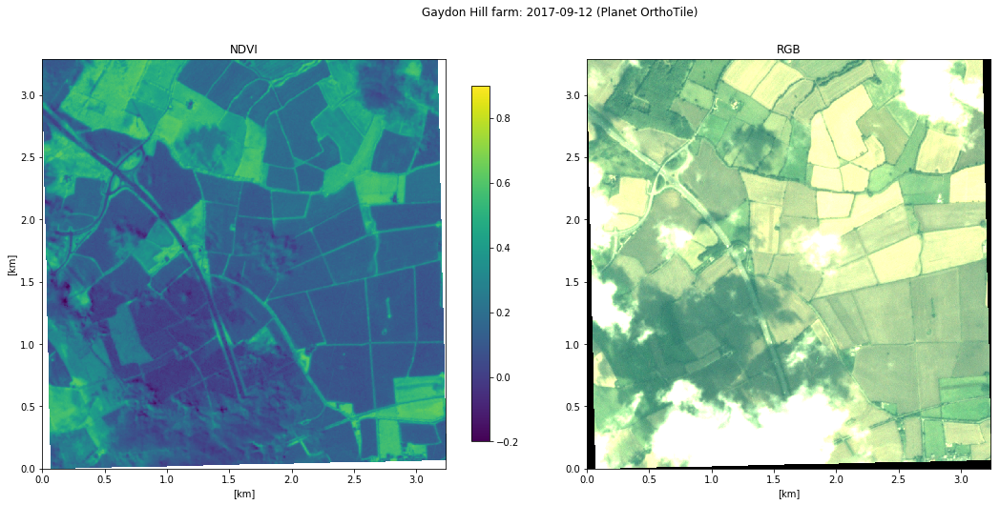

-------------------------------------------------
37 793519_3063119_2017-09-28_101f_BGRN_Analytic_clip.tif
masked fraction in clip: 61.4 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
38 794547_3063119_2017-09-24_1002_BGRN_Analytic_clip.tif
masked fraction in clip: 40.9 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
39 800232_3063119_2017-09-14_0f1b_BGRN_Analytic_clip.tif
masked fraction in clip: 93.1 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
40 804986_3063119_2017-10-02_1008_BGRN_Analytic_clip.tif
masked fraction in clip: 96.9 percent
discarding because of missing data / cloud coverage
-------------------------------------------------
41 812551_3063119_2017-10-05_0e16_BGRN_Analytic_clip.tif
masked fraction in clip: 64.2 percent
discarding because of missing data / cloud coverage
---------------

In [14]:
lims_scRA = [(2500,7000), (3500, 8000), (4500,10000)]
lims_TOA = [(0.06,0.15), (0.06, 0.15), (0.06,0.2)]

for i,(fp,d) in enumerate(zip(fileorg_rect.flist_analytic,fileorg_rect.dates)):
    print('-------------------------------------------------')
    print(i,fp)
    PlIm = PlanetImage.PlanetImage(os.path.join(datapath,fp),
                                  asset_type,item,verbose=False)
    PlIm.get_mask(show=False)
    if PlIm.maskFractionClip > 0.1: #arbitrary threshold
        print('discarding because of missing data / cloud coverage')
        continue
         
    fig,(ax0,ax1) = plt.subplots(1,2,figsize=(16,8))
    fig.suptitle('Gaydon Hill farm: '+d+' (Planet OrthoTile)')
    fig.subplots_adjust(wspace=0.05,hspace=0.05,top=0.88)
    fig.tight_layout()
    
    ndvi = PlIm.get_NDVI()
    extent_km = (0,ndvi.shape[1]*PlIm.xpixsize/1e3,0,ndvi.shape[0]*PlIm.ypixsize/1e3)
    im0 = ax0.imshow(ndvi,vmin=-0.2,vmax=0.9,extent=extent_km)
    plt.colorbar(im0,ax=ax0,shrink=0.7)
    ax0.set_title('NDVI')
    ax0.set_xlabel('[km]')
    ax0.set_ylabel('[km]')
    
    rgb_ha = PlIm.get_histnorm_rgb(use_TOA=True,lims=lims_TOA)
    im1 = ax1.imshow(rgb_ha,extent=extent_km)
    #hacked way of scaling figures to same size
    plt.colorbar(im1,ax=ax1).remove()
    ax1.set_title('RGB')
    ax1.set_xlabel('[km]')
    
    plt.savefig('plots/gaydonhill_'+d+'.png',bbox_inches='tight')
    plt.show()